In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

In [2]:
model = tf.keras.models.load_model('model.h5')
model.summary();

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_70 (Conv2D)           (None, 222, 222, 32)      320       
_________________________________________________________________
activation_69 (Activation)   (None, 222, 222, 32)      0         
_________________________________________________________________
max_pooling2d_60 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 109, 109, 32)      9248      
_________________________________________________________________
activation_70 (Activation)   (None, 109, 109, 32)      0         
_________________________________________________________________
max_pooling2d_61 (MaxPooling (None, 54, 54, 32)        0         
_________________________________________________________________
conv2d_72 (Conv2D)           (None, 52, 52, 64)      

In [3]:
for layer in model.layers:
      if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        
        f_min, f_max = weights.min(), weights.max()
        
        filters = (weights - f_min) / (f_max - f_min)  
        print(layer.name, filters.shape)

        print(filters.shape[3])
        filter_cnt=1
        
        for i in range(filters.shape[3]):
            filt=filters[:,:,:, i]
            print(filt)
            
        


conv2d_70 (3, 3, 1, 32)
32
[[[0.897985  ]
  [0.11314771]
  [0.00511989]]

 [[0.61530864]
  [0.5440169 ]
  [0.22610396]]

 [[0.54264265]
  [0.7350282 ]
  [0.7315259 ]]]
[[[0.77764994]
  [0.5341464 ]
  [0.7934364 ]]

 [[0.7818967 ]
  [0.77125305]
  [0.07127408]]

 [[0.6358692 ]
  [0.2670874 ]
  [0.66257995]]]
[[[0.4040056 ]
  [0.16903402]
  [0.14575225]]

 [[0.5742353 ]
  [0.64842093]
  [0.6153016 ]]

 [[0.9384491 ]
  [0.32726404]
  [0.29168853]]]
[[[0.09752516]
  [0.30718732]
  [0.02280186]]

 [[0.51793957]
  [0.84378964]
  [0.75612456]]

 [[0.46578598]
  [0.8575227 ]
  [0.4952058 ]]]
[[[0.47719008]
  [0.634561  ]
  [0.14944412]]

 [[0.5967938 ]
  [0.4785362 ]
  [0.70460355]]

 [[0.10319716]
  [0.22402781]
  [0.26695493]]]
[[[0.67314136]
  [0.81621647]
  [0.7901753 ]]

 [[0.41319183]
  [0.5606908 ]
  [0.6541583 ]]

 [[0.39289188]
  [0.66581345]
  [0.7157535 ]]]
[[[0.25981507]
  [0.7778119 ]
  [0.66603297]]

 [[0.04688375]
  [0.        ]
  [0.63168633]]

 [[0.21564974]
  [0.35495165]
  [

   0.54257286 0.6022029 ]]]
[[[0.49738178 0.60962677 0.54273754 0.60972244 0.39748484 0.26200965
   0.35940844 0.39723557 0.35889772 0.6528047  0.5683963  0.5298848
   0.64426225 0.26109347 0.09860313 0.36139536 0.39448223 0.6387529
   0.33543015 0.47771788 0.26425853 0.5743897  0.39570907 0.4042209
   0.34810045 0.45040676 0.596042   0.3968151  0.55340624 0.4556224
   0.5270372  0.40918458]
  [0.56795883 0.49727777 0.40252358 0.27680588 0.3590773  0.29468015
   0.5162499  0.22935522 0.57549196 0.39195958 0.38018605 0.41364068
   0.73618716 0.3275894  0.31156352 0.76265883 0.6038368  0.46225515
   0.44953525 0.5802918  0.37024462 0.41355523 0.49378413 0.48251286
   0.38224223 0.6802616  0.5376792  0.37547648 0.6051325  0.21644494
   0.45013142 0.45700738]
  [0.2184031  0.6325506  0.42965162 0.44769278 0.2663546  0.5671039
   0.63411695 0.42472088 0.5618711  0.5897877  0.3180664  0.2876079
   0.60757226 0.3780725  0.23814757 0.600315   0.31550816 0.63179594
   0.5154276  0.4542617  0.31

   0.34529993 0.56803036]]]
[[[0.69690293 0.39050832 0.288028   0.42747945 0.6279227  0.25960228
   0.38705236 0.70904374 0.579814   0.39566982 0.6802842  0.3113946
   0.20649453 0.6176972  0.39885342 0.39268506 0.57289004 0.49586698
   0.4947176  0.5125367  0.28121337 0.35044065 0.35812292 0.29807544
   0.5280081  0.4603323  0.5060458  0.3252594  0.5550368  0.67992437
   0.28470424 0.39652038]
  [0.31639662 0.56551194 0.48993388 0.25611505 0.65905374 0.29985228
   0.35792714 0.3280911  0.43968794 0.3379157  0.30046496 0.6392915
   0.38904372 0.5525288  0.3416938  0.41828904 0.2612158  0.6333125
   0.31071198 0.4168253  0.3196322  0.3436677  0.524206   0.55960435
   0.5184597  0.6942323  0.5138127  0.6287591  0.560202   0.4882727
   0.5445021  0.679406  ]
  [0.35407093 0.30421743 0.63103217 0.5266492  0.2704933  0.32359487
   0.41979828 0.23566535 0.37734893 0.39974916 0.21511106 0.22660303
   0.67003995 0.4807389  0.4408367  0.5424892  0.48729855 0.6015944
   0.50654423 0.6285304  0.2

[[[0.48892042 0.36100134 0.41893268 0.3241055  0.3909796  0.2736715
   0.44078654 0.46294275 0.45403704 0.40304533 0.28942204 0.49304548
   0.44626012 0.3503113  0.4350237  0.42892462 0.51027256 0.47798634
   0.5498587  0.48003182 0.5387166  0.542319   0.46504003 0.29900488
   0.3007327  0.4204799  0.3409292  0.3876448  0.2966509  0.42962095
   0.34632435 0.39311618 0.5200339  0.29616868 0.3382452  0.3821283
   0.38954362 0.30307105 0.47324088 0.27695867 0.51153797 0.5072312
   0.48065594 0.5593687  0.43327138 0.324466   0.33172345 0.36448106
   0.40956855 0.42919624 0.42632806 0.5074337  0.43458453 0.4696258
   0.30088094 0.33889946 0.4114366  0.33269653 0.49047998 0.43176368
   0.32470438 0.5256018  0.43002307 0.45160422]
  [0.3510819  0.3913671  0.4809279  0.3644756  0.47908783 0.29829165
   0.4343601  0.30369943 0.36533323 0.32623997 0.4257322  0.41491854
   0.36697832 0.5116094  0.37635726 0.45240763 0.51477915 0.38169783
   0.42527872 0.53606546 0.44350502 0.5067677  0.5524337  0

   0.51918983 0.4340077  0.3465248  0.44249853]]]
[[[0.25585714 0.39962062 0.3261866  0.5307761  0.45073083 0.3920519
   0.53269535 0.33492815 0.5263722  0.41881856 0.39755952 0.57482255
   0.48013696 0.5285559  0.38397455 0.35725257 0.44577572 0.2988822
   0.28187817 0.3847979  0.4200541  0.39392847 0.48374668 0.3396814
   0.3933589  0.3500701  0.33955365 0.47731102 0.3045618  0.47730768
   0.46931648 0.32602447 0.41779324 0.38151926 0.47867656 0.22541802
   0.4743419  0.34724802 0.4651063  0.3503514  0.43677136 0.549692
   0.32782984 0.31569064 0.39048815 0.32664293 0.3669224  0.524344
   0.42976746 0.4477319  0.2643018  0.5374495  0.36091724 0.30686995
   0.35453442 0.23937131 0.40750712 0.28508237 0.54499793 0.31920695
   0.4626812  0.43340388 0.34707657 0.27020174]
  [0.66177714 0.54851216 0.4326278  0.64873904 0.41316798 0.44396737
   0.55193794 0.41086122 0.45949858 0.31905937 0.4191219  0.35228115
   0.3096304  0.6517788  0.3419005  0.3121923  0.54556227 0.47955343
   0.3858798

[[[0.7379726  0.5563402  0.39183274 0.40087003 0.4230841  0.33201963
   0.45948753 0.52634126 0.198865   0.47343785 0.4440371  0.3057437
   0.4351473  0.42413145 0.49279368 0.5071126  0.4951338  0.31749806
   0.28724268 0.48658487 0.5981344  0.35414445 0.50304186 0.45212644
   0.29456326 0.33622673 0.30395362 0.5164763  0.47021997 0.29027778
   0.6594031  0.37485766 0.44163722 0.48992938 0.49720702 0.5731273
   0.47846365 0.39494306 0.38584715 0.27790993 0.3495418  0.40603298
   0.37390387 0.31876034 0.2981819  0.4567976  0.25281516 0.47072187
   0.44755504 0.35619453 0.263892   0.3446699  0.3556112  0.49933693
   0.3352527  0.47854614 0.48661965 0.38087282 0.50255305 0.45933628
   0.2535187  0.41723204 0.4689535  0.28013003]
  [0.34127328 0.39349008 0.42447317 0.54500425 0.6042102  0.3304297
   0.44128117 0.30495042 0.21833384 0.26352918 0.43895596 0.5912011
   0.4759771  0.580064   0.44581318 0.31921136 0.48447433 0.4830957
   0.22304542 0.53519183 0.393678   0.38275433 0.52076495 0.

[[[0.31421065 0.54354465 0.4848524  0.4641969  0.5321656  0.5512941
   0.3584791  0.46093956 0.49412227 0.5426928  0.51042295 0.52608514
   0.313404   0.42428365 0.46276513 0.50510997 0.28838396 0.35714737
   0.5267798  0.5441898  0.40855077 0.35598102 0.3641616  0.30812147
   0.32971892 0.48902935 0.44793424 0.54545593 0.29768515 0.3835108
   0.39796436 0.32243595 0.38451815 0.40752017 0.5268365  0.39651296
   0.35694143 0.44862083 0.56059587 0.40591863 0.34895572 0.43473625
   0.39530766 0.3252747  0.4600564  0.30675772 0.5305337  0.51419884
   0.50824904 0.37481013 0.3785974  0.349925   0.3332129  0.38490272
   0.3568904  0.48456326 0.4137933  0.49096307 0.46881738 0.3697029
   0.37326357 0.43525115 0.4575701  0.49569228]
  [0.53791565 0.51805186 0.5277322  0.5368967  0.5394425  0.3074079
   0.3426803  0.54180396 0.49655706 0.47940442 0.45787355 0.40043837
   0.41260332 0.32702413 0.41303855 0.40011814 0.33203143 0.42952994
   0.48935056 0.517371   0.37193486 0.35179722 0.37719956 0

[[[0.76415676 0.35300368 0.35644907 0.68139493 0.6031269  0.45011508
   0.47843567 0.3983408  0.23653804 0.2935199  0.30244794 0.44555604
   0.545407   0.45558092 0.52551234 0.45824382 0.4504024  0.40315107
   0.6245244  0.4232616  0.5317199  0.5751392  0.50623244 0.37173304
   0.36182365 0.3087412  0.48864827 0.462251   0.5142516  0.47946241
   0.38156635 0.3167308  0.4062417  0.26371282 0.4974562  0.57421124
   0.42804912 0.40716302 0.5024696  0.38461137 0.4596537  0.317346
   0.50349534 0.449121   0.276293   0.34876984 0.5218866  0.42851436
   0.2967919  0.5128689  0.4944966  0.42057186 0.3647798  0.5300704
   0.41691196 0.49566954 0.41129872 0.41930628 0.33078924 0.51631737
   0.29086038 0.5651792  0.37522632 0.5495544 ]
  [0.87664026 0.39139256 0.22352679 0.6405256  0.43116343 0.32133436
   0.28406546 0.36739975 0.2734725  0.36376435 0.42516375 0.33781856
   0.32934427 0.3830804  0.5446587  0.4096651  0.41871905 0.47266287
   0.3464715  0.35674202 0.28939962 0.5182296  0.49366096 

conv2d_70 (3, 3, 1, 32)
32


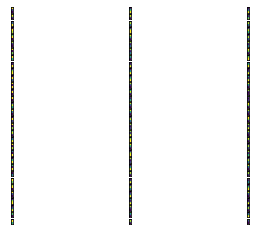

conv2d_71 (3, 3, 32, 32)
32


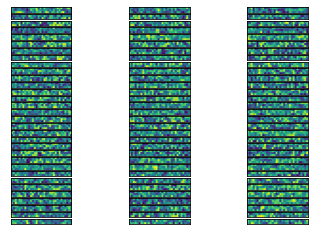

conv2d_72 (3, 3, 32, 64)
64


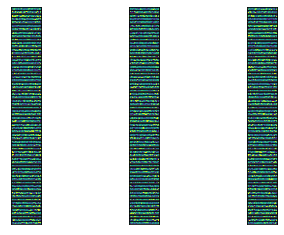

conv2d_73 (3, 3, 64, 64)
64


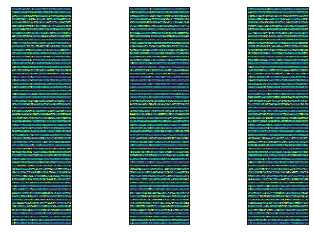

In [4]:
for layer in model.layers:
      if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        
        f_min, f_max = weights.min(), weights.max()
        
        filters = (weights - f_min) / (f_max - f_min)  
        print(layer.name, filters.shape)

        print(filters.shape[3])
        filter_cnt=1
        
        for i in range(filters.shape[3]):
            filt=filters[:,:,:, i]
            for j in range(filters.shape[0]):
                ax= plt.subplot(filters.shape[3], filters.shape[0], filter_cnt  )
                ax.set_xticks([])
                ax.set_yticks([])
                plt.imshow(filt[:, j])
                filter_cnt+=1
        plt.show()

(1, 222, 222, 32)
32
(1, 222, 222, 32)


<ipython-input-5-caac00c310f6>:21: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()


32
(1, 111, 111, 32)
32
(1, 109, 109, 32)
32
(1, 109, 109, 32)
32
(1, 54, 54, 32)
32
(1, 52, 52, 64)
64
(1, 52, 52, 64)
64
(1, 26, 26, 64)
64
(1, 24, 24, 64)
64
(1, 24, 24, 64)
64
(1, 12, 12, 64)
64
(1, 9216)
(1, 64)
(1, 1)
(1, 1)


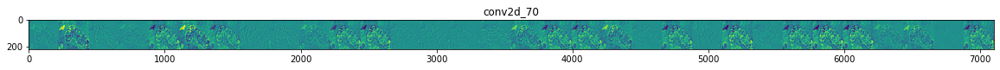

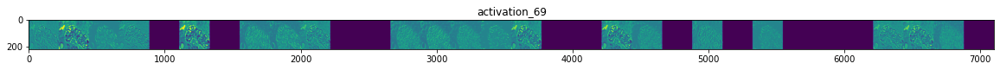

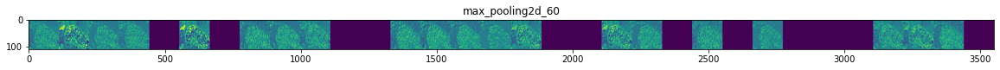

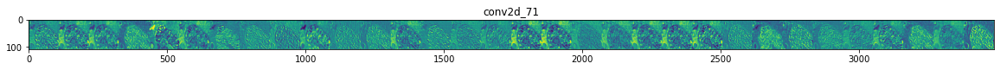

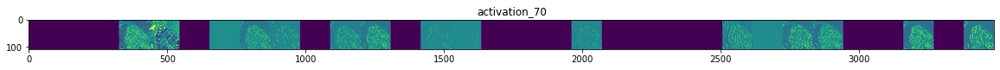

...

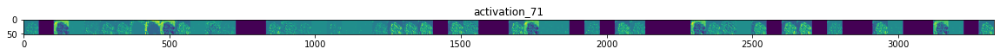

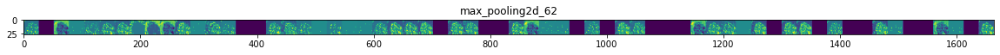

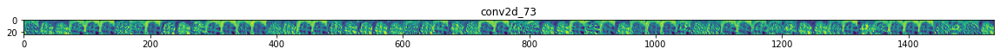

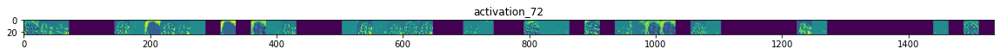

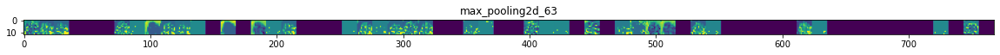

In [5]:
img_path = "Data1/Test/Benign/0 (1).png"
successive_outputs = [layer.output for layer in model.layers]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
img = load_img(img_path, target_size=(224, 224))
img= cv2.imread(img_path,0)
img = cv2.resize(img,(224,224))
x   = np.array(img).reshape(-1,224,224,1)
successive_feature_maps = visualization_model.predict(x)
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:
    n_features = feature_map.shape[-1] 
    size       = feature_map.shape[ 1]  
    
    display_grid = np.zeros((size, size * n_features))
    
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size : (i + 1) * size] = x
    scale = 20. / n_features 
    print(n_features)
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )
    cv2.imwrite(f"visualization/{layer_name}.png",display_grid)


In [6]:
for each in successive_feature_maps:
    print(each)

[[[[ 56.9506     89.50929   143.3015    ... 158.0485     76.97333
    142.53859  ]
   [ 80.58501   122.59528   134.94695   ... 184.86087   133.24539
    128.46878  ]
   [122.33228   146.23288   140.52138   ... 157.01405   137.91129
    132.44382  ]
   ...
   [150.25461   127.565414  160.5445    ... 104.652      60.479385
    129.56721  ]
   [ 89.689896  125.70279   143.21098   ... 167.76367   111.62235
    119.64813  ]
   [111.22301   131.76161    86.21527   ... 156.56805   149.58344
     95.58155  ]]

  [[ 72.188736  126.46519    71.77066   ... 148.32184    98.439674
    126.683586 ]
   [ 65.74007   146.00224    60.398872  ... 175.46268   112.357025
    124.97254  ]
   [ 70.79175   147.31227    50.22074   ... 187.12874   135.04823
    122.045425 ]
   ...
   [199.85759   156.63855   129.79823   ...  50.96292   108.832146
    111.87377  ]
   [104.390976  126.80796   175.14493   ... 127.79051     4.5201035
    124.17727  ]
   [ 74.592094  134.59395   144.34454   ... 183.20415   139.44554

In [7]:
for each in model.layers[1:]:
    print(each)

In [8]:
for each in model.layers:
    print(each)

(3, 222, 222, 32)
(3, 111, 111, 32)
(3, 109, 109, 32)
(3, 109, 109, 32)


<ipython-input-9-03266f86ef4b>:34: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()


(3, 54, 54, 32)
(3, 52, 52, 64)
(3, 52, 52, 64)
(3, 26, 26, 64)
(3, 24, 24, 64)
(3, 24, 24, 64)
(3, 12, 12, 64)
(3, 9216)
(3, 64)
(3, 1)
(3, 1)


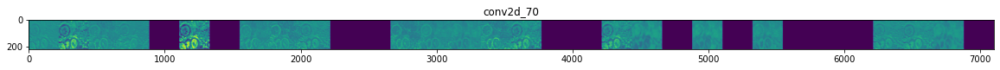

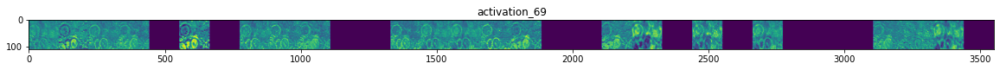

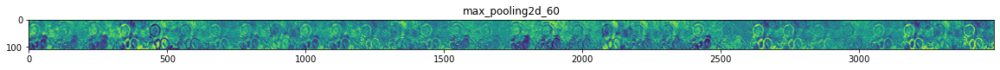

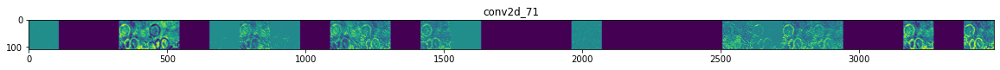

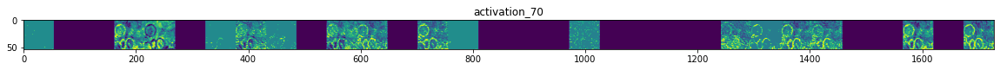

...

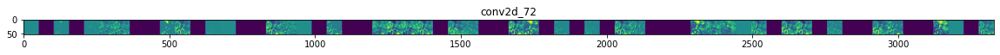

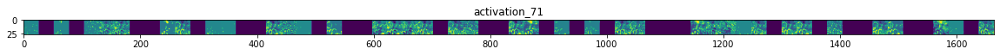

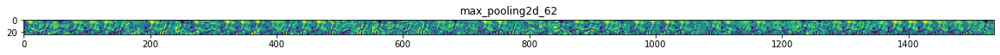

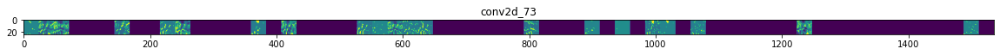

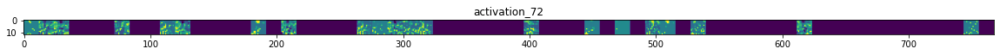

In [9]:
img_path = "Data1/Test/Benign/0 (1).png"

successive_outputs = [layer.output for layer in model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
#Load the input image
img = load_img(img_path, target_size=(224, 224))
# Convert ht image to Array of dimension (150,150,3)
x   = img_to_array(img)                           
x   = np.array(img).reshape(-1,224,224,1)
# Rescale by 1/255
x = x/ 255
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:
    
    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
   
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )

(3, 222, 222, 32)


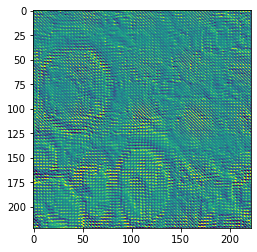

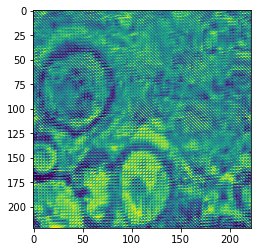

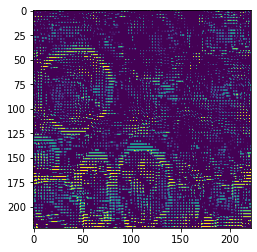

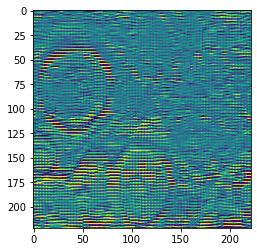

<ipython-input-10-1e95217089c3>:34: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()


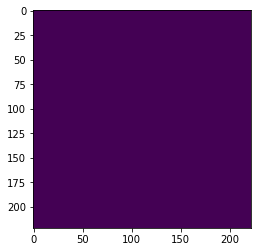

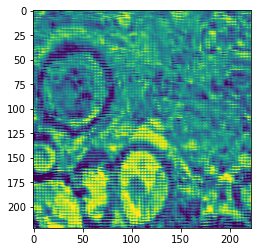

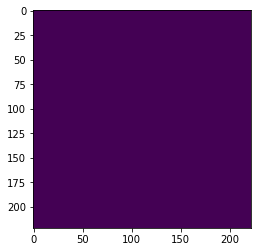

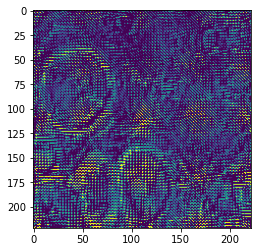

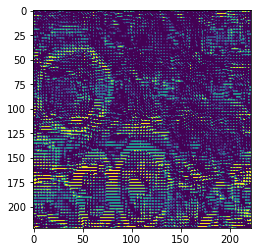

...

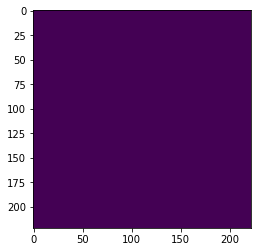

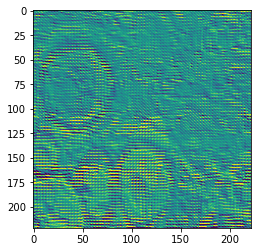

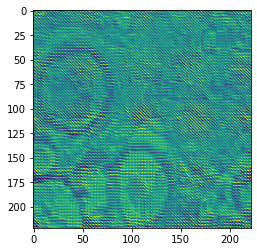

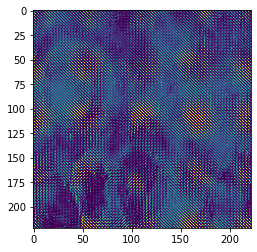

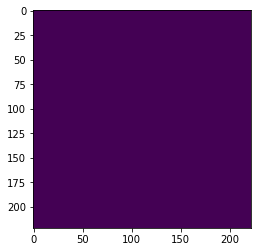

(3, 111, 111, 32)


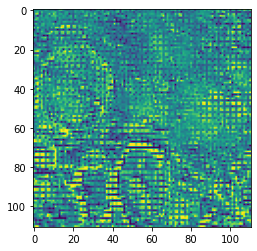

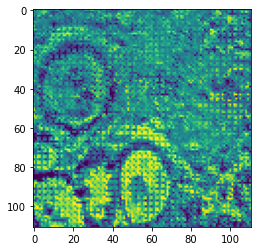

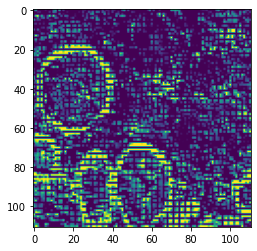

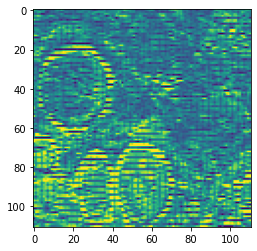

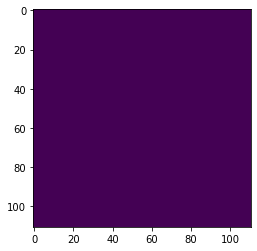

...

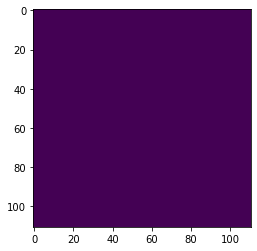

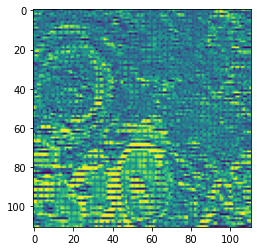

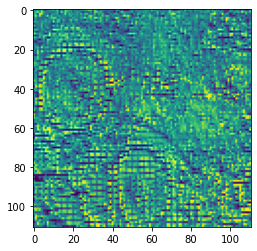

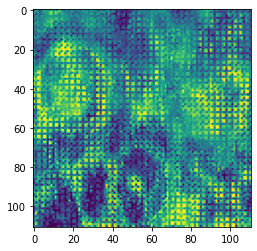

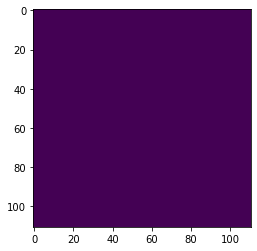

(3, 109, 109, 32)


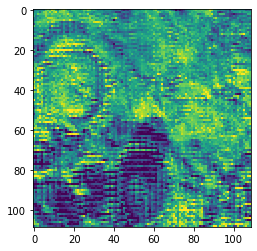

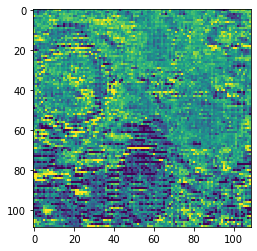

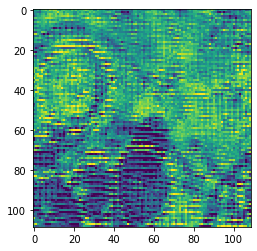

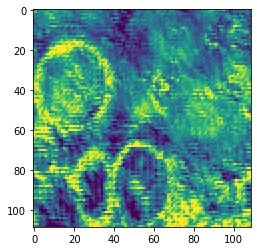

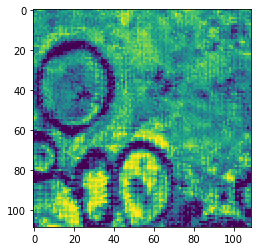

...

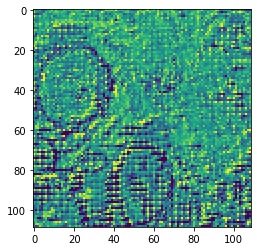

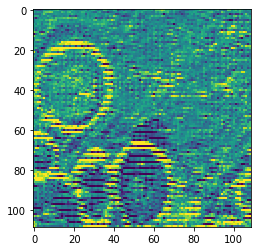

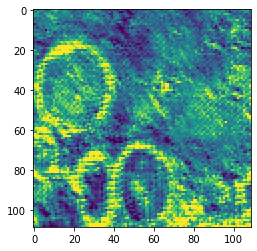

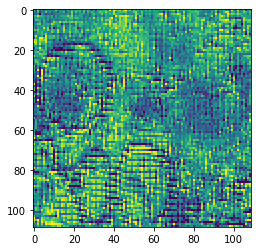

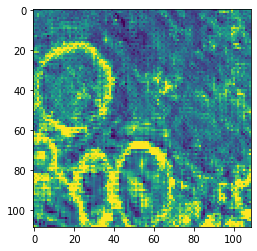

(3, 109, 109, 32)


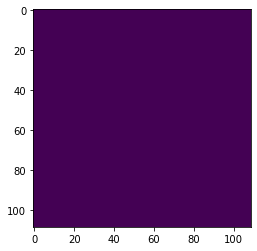

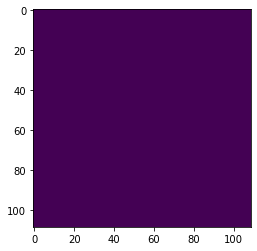

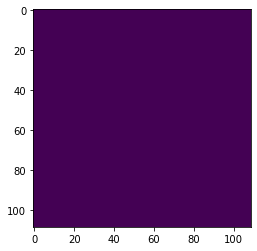

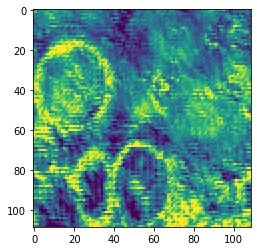

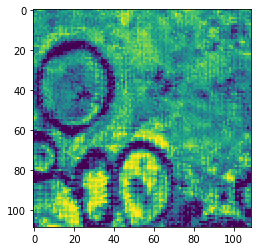

...

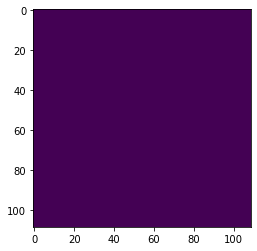

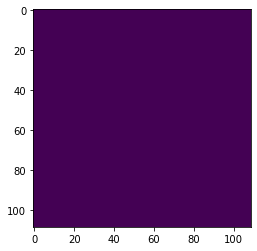

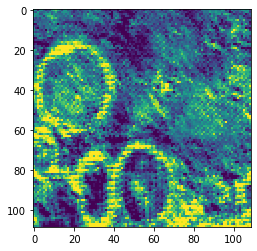

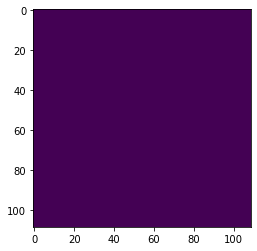

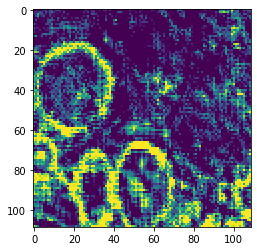

(3, 54, 54, 32)


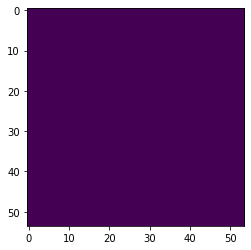

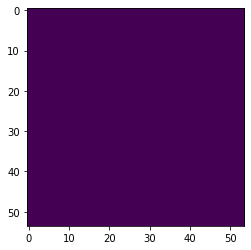

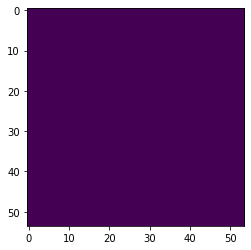

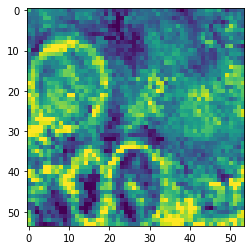

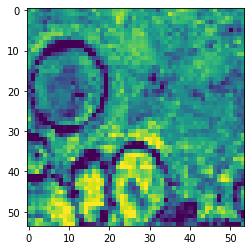

...

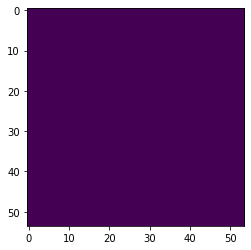

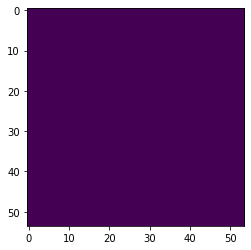

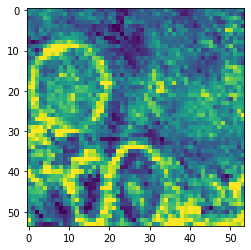

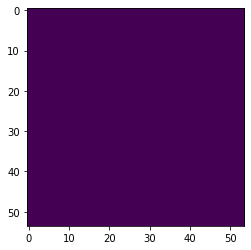

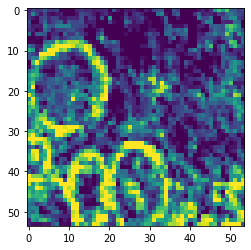

(3, 52, 52, 64)


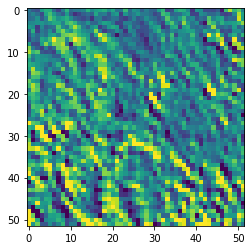

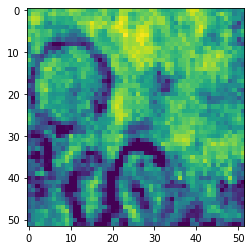

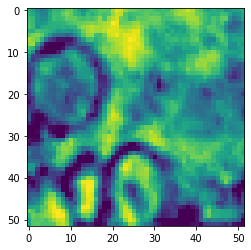

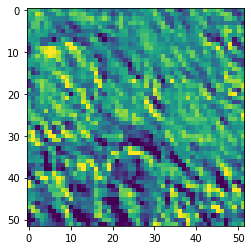

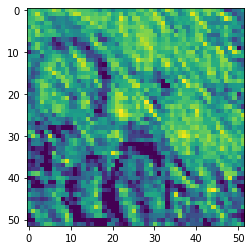

...

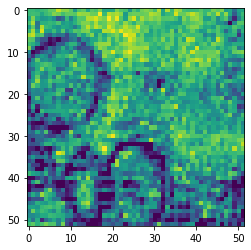

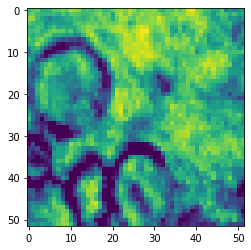

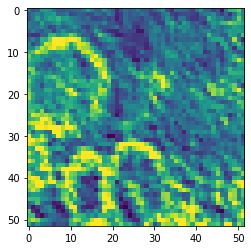

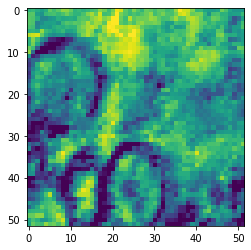

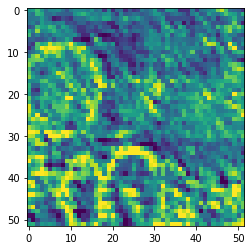

(3, 52, 52, 64)


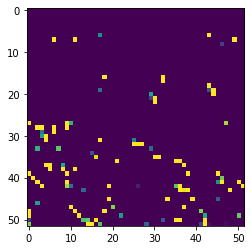

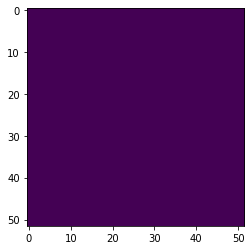

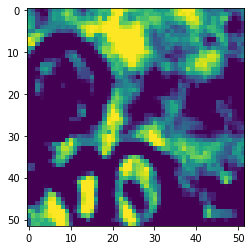

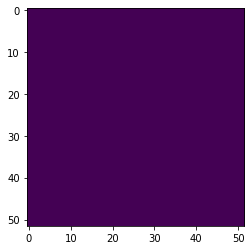

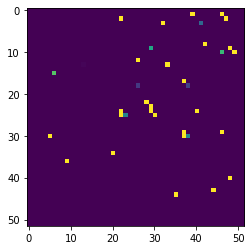

...

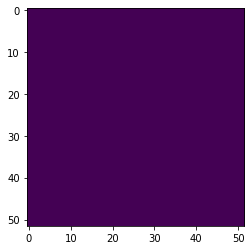

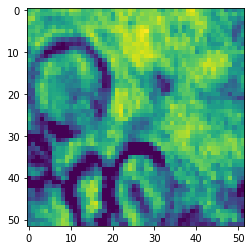

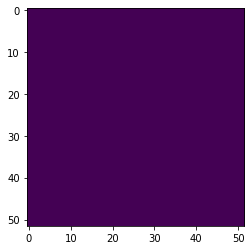

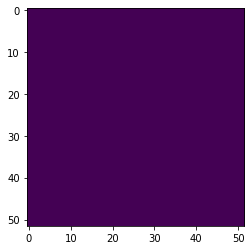

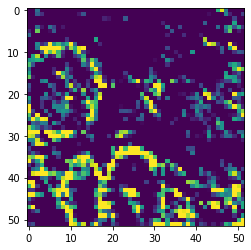

(3, 26, 26, 64)


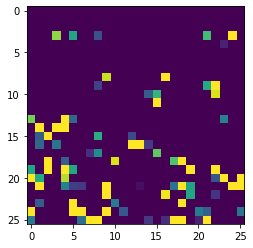

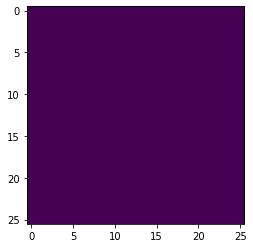

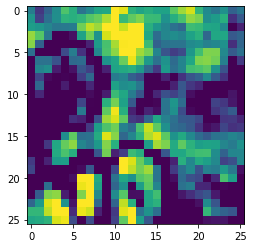

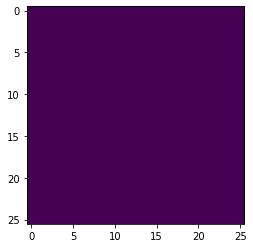

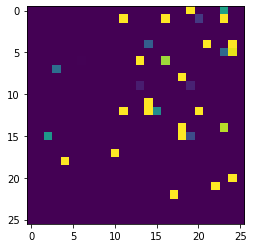

...

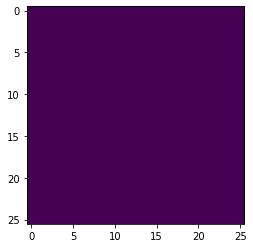

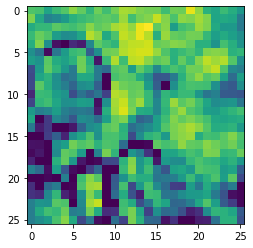

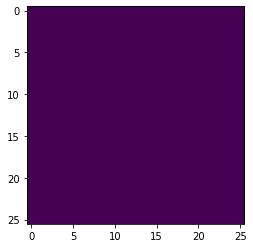

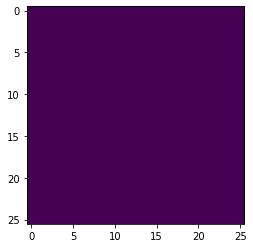

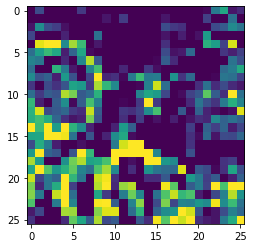

(3, 24, 24, 64)


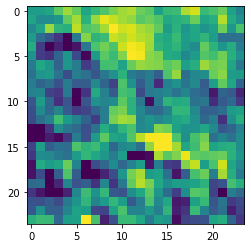

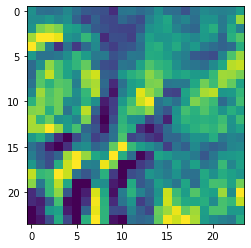

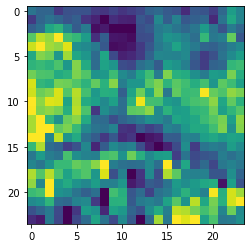

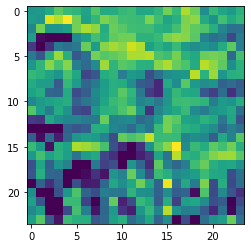

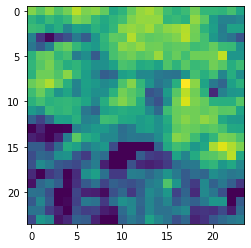

...

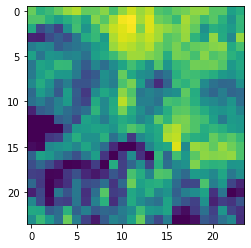

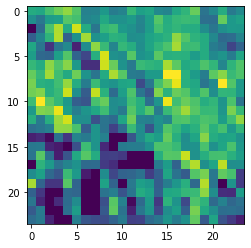

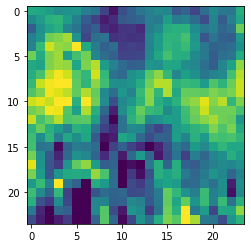

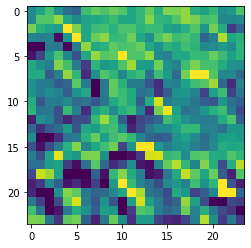

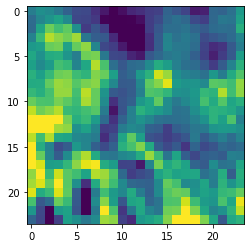

(3, 24, 24, 64)


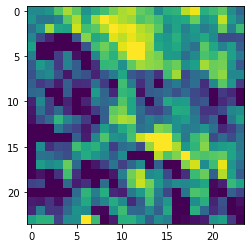

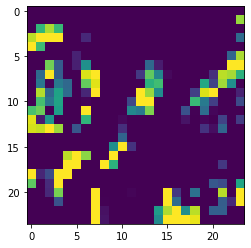

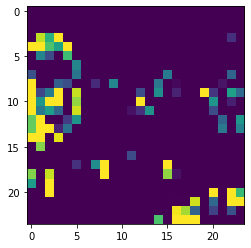

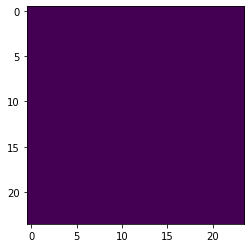

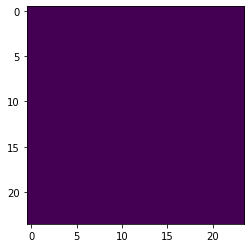

...

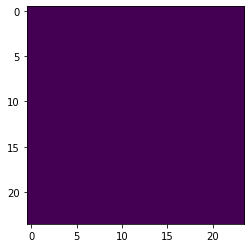

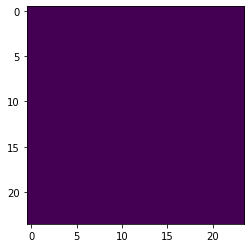

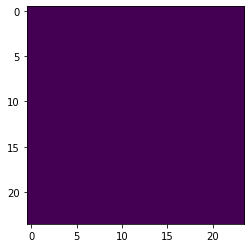

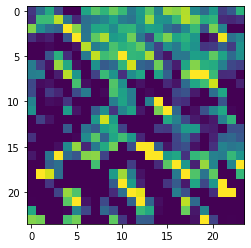

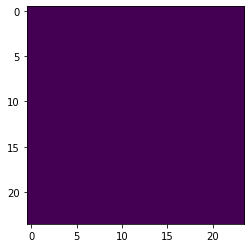

(3, 12, 12, 64)


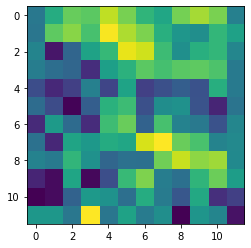

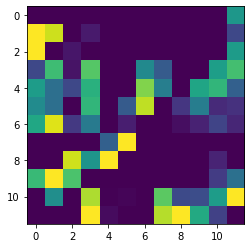

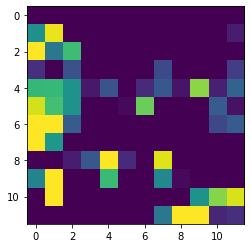

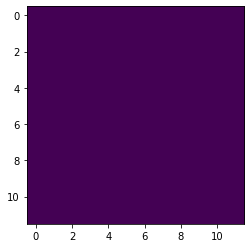

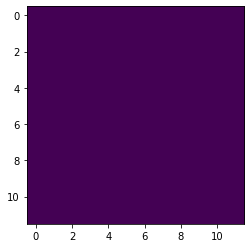

...

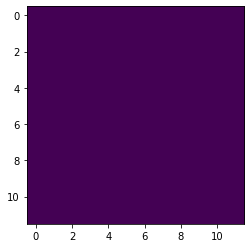

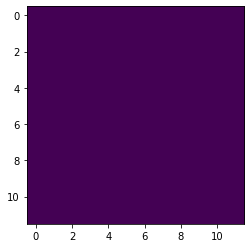

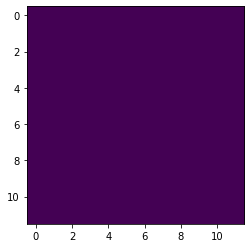

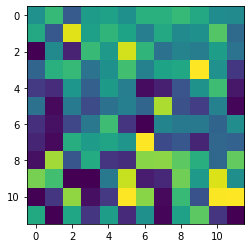

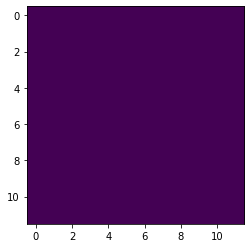

(3, 9216)
(3, 64)
(3, 1)
(3, 1)


In [10]:
img_path = "Data1/Test/Benign/0 (1).png"

successive_outputs = [layer.output for layer in model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
#Load the input image
img = load_img(img_path, target_size=(224, 224))
# Convert ht image to Array of dimension (150,150,3)
x   = img_to_array(img)                           
x   = np.array(img).reshape(-1,224,224,1)
# Rescale by 1/255
x = x/5
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:
    
    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
   
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      plt.imshow(x)
      plt.show()